In [60]:
import pandas as pd
import numpy as np
from matplotlib import *
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [12]:
df = pd.read_excel("RawData.xlsx")
df.drop([0], inplace = True)

In [13]:
df = df.rename({"Northing (x)": "Northing (y)","Easting (y)":"Easting (x)","Trend (Delta)": "Trend on Northing (Delta)"}, axis = 1) 

In [14]:
df.head()

,Zone,Record #,Northing (y),Easting (x),Elevation (z),Trend on Northing (Delta)
1,13T,1.0,5251798.69,318432.61,952,39
2,13T,2.0,5255062.27,318541.34,1015,71
3,13T,3.0,5248962.85,319108.32,934,14
4,13T,4.0,5251012.08,320757.63,948,40
5,13T,5.0,5251334.14,321020.63,948,38


In [15]:
def kp(east, north,h):
    kpb=east*(-2.2947*10**-3)+north*(2.6741*10**-3)-12435.4
    corr=h-kpb
    return corr

In [16]:
df['Corr_elev']=kp(east=df['Easting (x)'], north=df['Northing (y)'],h=df['Elevation (z)'])
df.head()

,Zone,Record #,Northing (y),Easting (x),Elevation (z),Trend on Northing (Delta),Corr_elev
1,13T,1.0,5251798.69,318432.61,952,39,74.272433
2,13T,2.0,5255062.27,318541.34,1015,71,128.794797
3,13T,3.0,5248962.85,319108.32,934,14,65.406305
4,13T,4.0,5251012.08,320757.63,948,40,77.71113
5,13T,5.0,5251334.14,321020.63,948,38,77.453416


In [17]:
df.sort_values(by=['Corr_elev'],inplace=True)
df.head()

,Zone,Record #,Northing (y),Easting (x),Elevation (z),Trend on Northing (Delta),Corr_elev
1665,13T,1665.0,5285224.34,401944.55,681,105,-94.476249
1666,13T,1666.0,5285172.12,401919.99,681,61,-94.392965
1667,13T,1667.0,5284434.44,402272.72,681,84,-91.610925
1668,13T,1668.0,5283968.9,402444.93,681,103,-89.970855
2133,13T,2133.0,5284058.33,402567.07,681,94,-89.929725


In [21]:
df.dropna()

,Zone,Record #,Northing (y),Easting (x),Elevation (z),Trend on Northing (Delta),Corr_elev
1665,13T,1665.0,5285224.34,401944.55,681,105,-94.476249
1666,13T,1666.0,5285172.12,401919.99,681,61,-94.392965
1667,13T,1667.0,5284434.44,402272.72,681,84,-91.610925
1668,13T,1668.0,5283968.9,402444.93,681,103,-89.970855
2133,13T,2133.0,5284058.33,402567.07,681,94,-89.929725
...,...,...,...,...,...,...,...
1012,13T,1012.0,5238956.37,391673.12,856,117,180.679079
1017,13T,1017.0,5238984.56,391992.24,857,91,182.335981
877,13T,877.0,5228892.71,385705.42,851,137,188.896231
930,13T,930.0,5238298.66,387222.84,875,147,191.225804


In [29]:
df.dropna(inplace = True)

In [30]:
df["delta"] = (90 - df["Trend on Northing (Delta)"].astype(int))

In [34]:
df["v_x"] = np.cos(df["delta"]*np.pi/180)
df["v_y"] = np.sin(df["delta"]*np.pi/180)

In [39]:
x = df["Easting (x)"].astype(int)
y = df["Northing (y)"].astype(int)
z = df["Elevation (z)"].astype(int)
v_x = df["v_x"]
v_y = df["v_y"] 

Text(0.5, 0, 'Easting (x)')

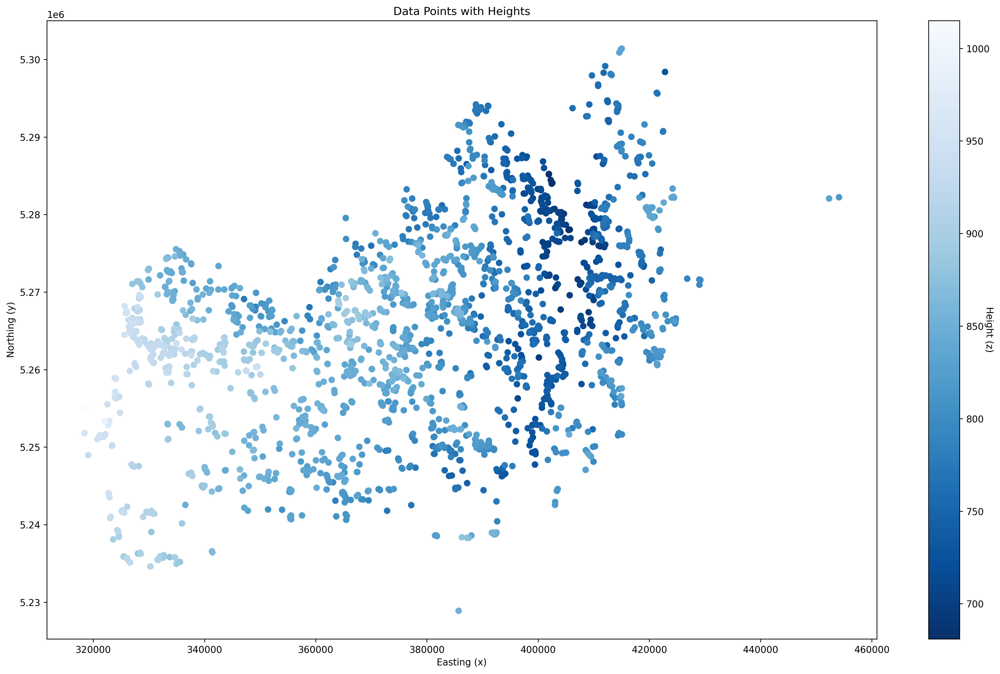

In [40]:
plt.figure(figsize=(20, 12), dpi= 250, facecolor='w', edgecolor='k')

plt.scatter(x, y, c=z, cmap="Blues_r")
cbar = plt.colorbar()
cbar.ax.set_ylabel('Height (z)', rotation=270)
plt.title(f"Data Points with Heights")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

Text(0.5, 0, 'Easting (x)')

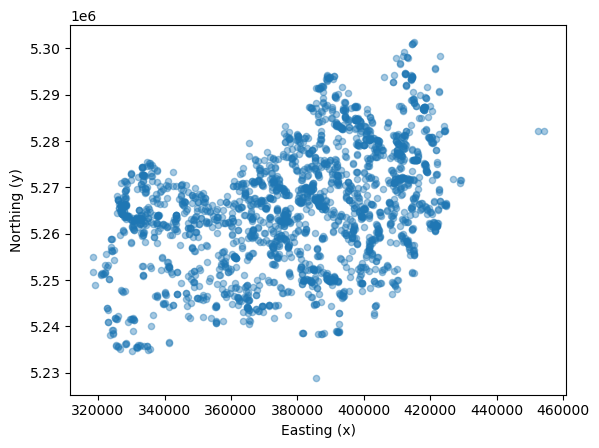

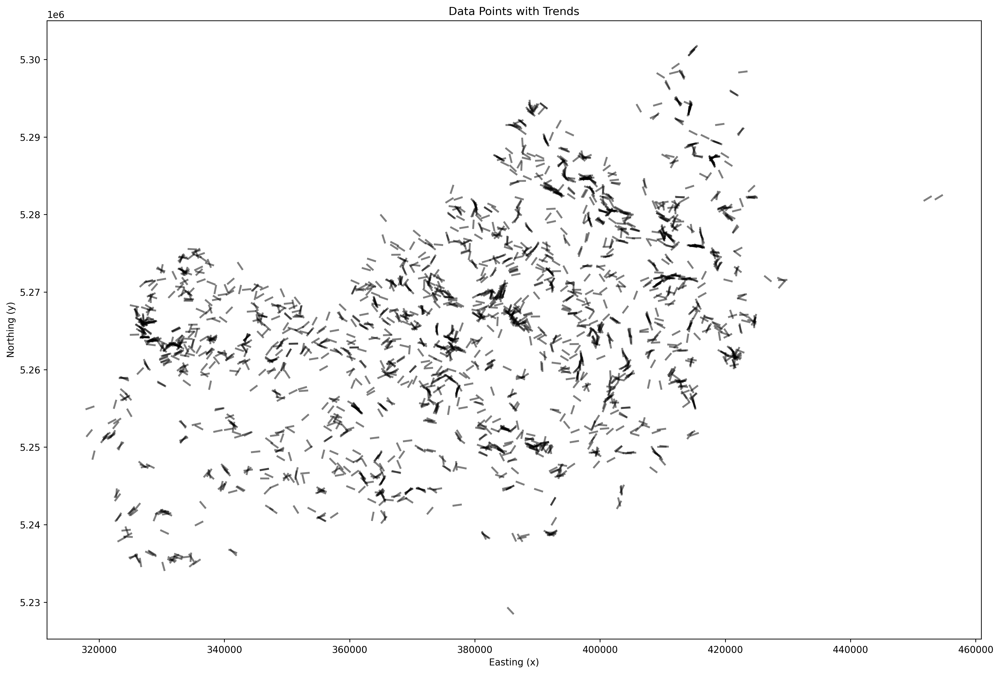

In [41]:
plt.figure(figsize=(18, 12), dpi= 250, facecolor='w', edgecolor='k')
plt.quiver(x,y,v_x,v_y, alpha = 0.5, color = 'black', scale = 200, width = 0.002, headlength = 0, headwidth = 1)
plt.quiver(x,y,-v_x,-v_y, alpha = 0.5, color = 'black', scale = 200, width = 0.002, headlength = 0, headwidth = 1)

plt.title(f"Data Points with Trends")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

Text(0.5, 0, 'Easting (x)')

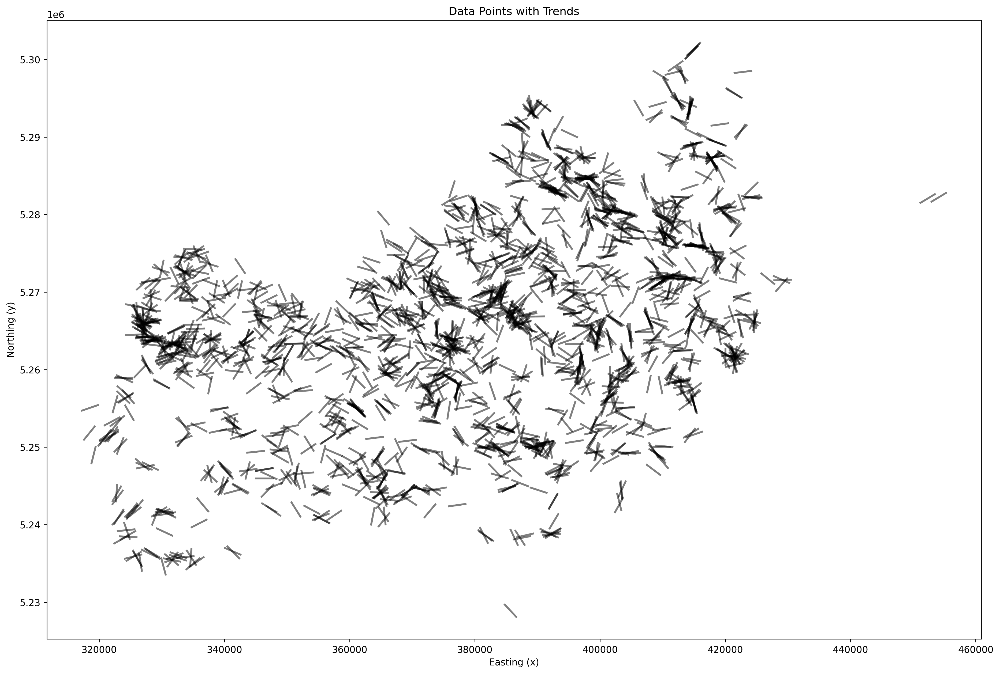

In [43]:
plt.figure(figsize=(18, 12), dpi= 250, facecolor='w', edgecolor='k')
plt.quiver(x,y,v_x,v_y, alpha = 0.5, color = 'black', scale = 100, width = 0.002, headlength = 0, headwidth = 1)
plt.quiver(x,y,-v_x,-v_y, alpha = 0.5, color = 'black', scale = 100, width = 0.002, headlength = 0, headwidth = 1)

plt.title(f"Data Points with Trends")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

In [ ]:
#Matrix Rotation 
theta = 49
tau = 0.2

def rotated_x(vector, degree):
    rotation_matrix = np.matrix([[1, 0, 0], [0, np.cos(degree), -np.sin(degree)], [0, np.sin(degree), np.cos(degree)]])
    return np.dot(rotation_matrix, vector)


def rotated_y(vector, degree):
    rotation_matrix = np.matrix([[np.cos(degree), 0, np.sin(degree)], [0, 1, 0], [-np.sin(degree), 0, np.cos(degree)]])
    return np.dot(rotation_matrix, vector)

def rotated_z(vector, degree):
    rotation_matrix = np.matrix([[np.cos(degree), -np.sin(degree), 0], [np.sin(degree), np.cos(degree), 0], [0, 0, 1]])
    return np.dot(rotation_matrix, vector)

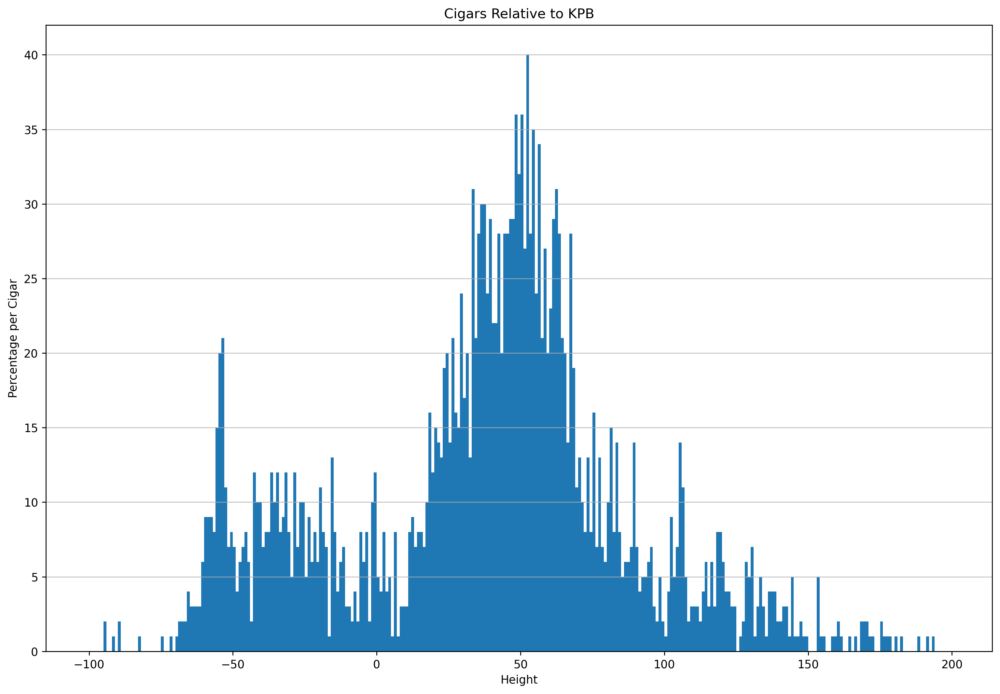

In [45]:
plt.figure(figsize=(15, 10), dpi= 250, facecolor='w', edgecolor='k')
plt.hist(df["Corr_elev"], bins=np.arange(-100, 200, 1))

plt.title('Cigars Relative to KPB')
plt.xlabel('Height')
plt.ylabel('Percentage per Cigar')
plt.grid(axis='y', alpha=0.75)

Text(0.5, 0, 'Easting (x)')

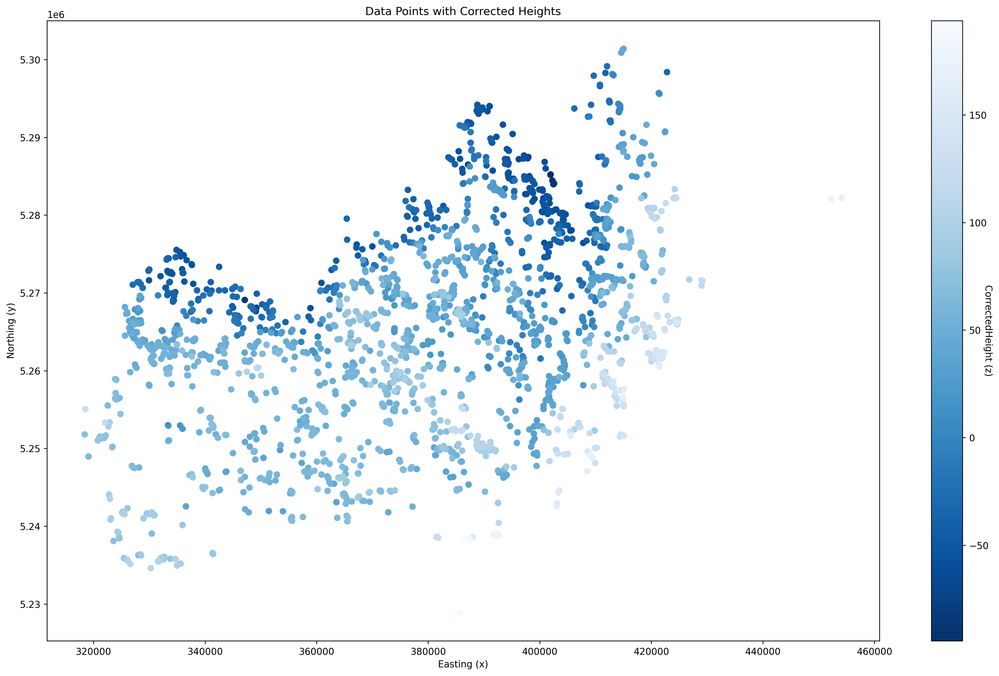

In [46]:
plt.figure(figsize=(20, 12), dpi= 250, facecolor='w', edgecolor='k')

plt.scatter(x, y, c=df["Corr_elev"], cmap="Blues_r")
cbar = plt.colorbar()
cbar.ax.set_ylabel('CorrectedHeight (z)', rotation=270)
plt.title(f"Data Points with Corrected Heights")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

<Axes: xlabel='delta', ylabel='Count'>

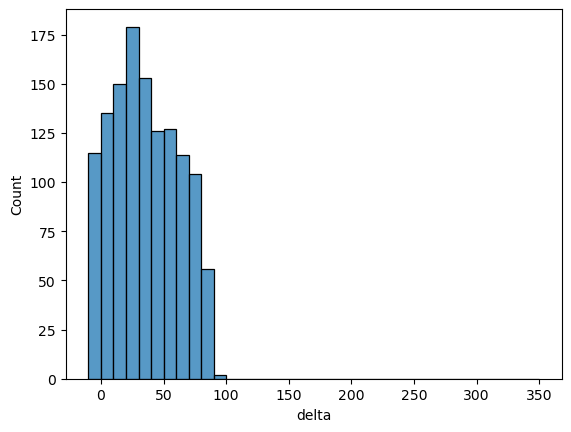

In [82]:
bin_edges = np.arange(-10, 360, 10)
number_of_cigars, bin_edges = np.histogram(df["Trend on Northing (Delta)"], bin_edges)
sns.histplot(df["delta"], bins =bin_edges)

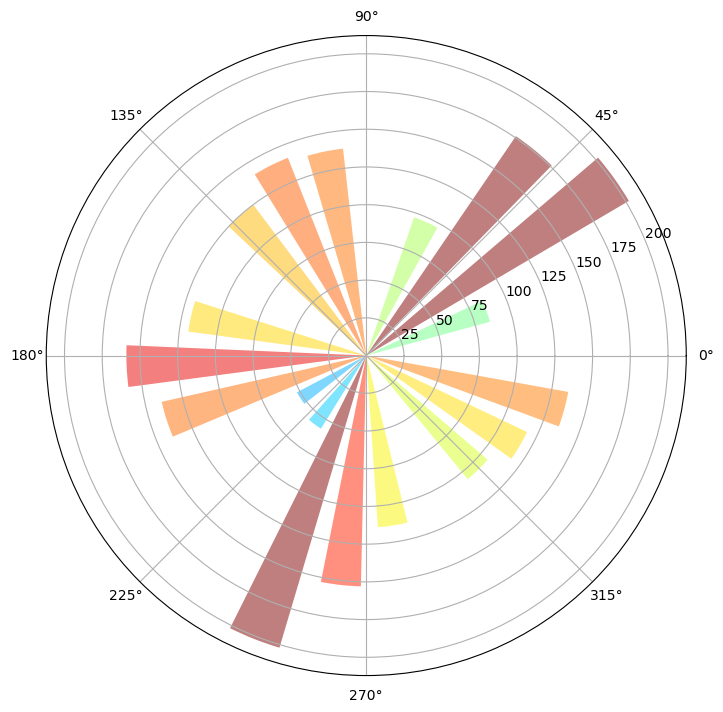

In [83]:
#Rose Diagram
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8], polar=True)


theta = np.arange(0, 360, 10)
radii = number_of_cigars
width = 2*np.pi/36
bars = ax.bar(theta, radii, width=width, bottom=0.0)
for r,bar in zip(radii, bars):
    bar.set_facecolor( matplotlib.cm.jet(r/175.))
    bar.set_alpha(0.5)

plt.show()

In [84]:
number_of_cigars[0] += number_of_cigars[-1]

In [85]:
half = np.sum(np.split(number_of_cigars[:-1], 2), 0)
two_halves = np.concatenate([half, half])

ValueError: array split does not result in an equal division

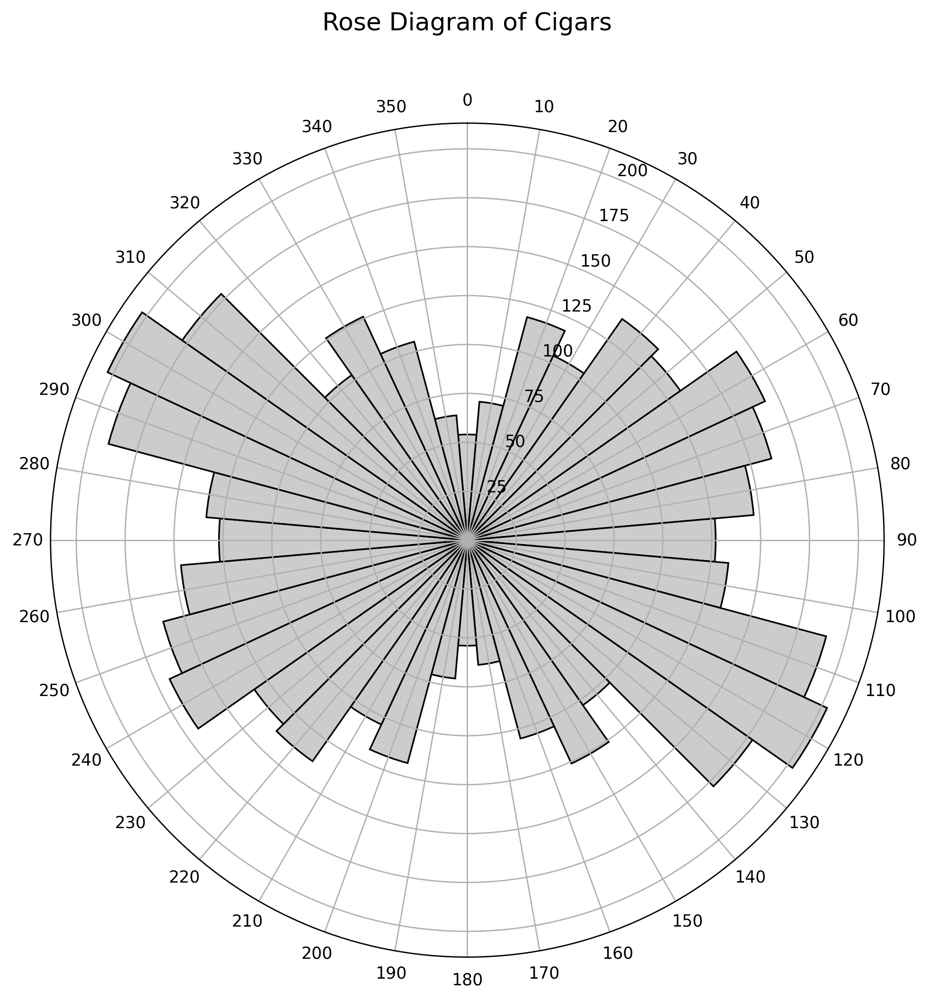

In [86]:
fig = plt.figure(figsize=(20, 12), dpi= 250, facecolor='w', edgecolor='k')

ax = fig.add_subplot(122, projection='polar')

ax.bar(np.deg2rad(np.arange(0, 360, 10)), two_halves, 
       width=np.deg2rad(10), bottom=0.0, color='.8', edgecolor='k')
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_thetagrids(np.arange(0, 360, 10), labels=np.arange(0, 360, 10))
ax.set_title('Rose Diagram of Cigars', y=1.10, fontsize=15)

# fig.tight_layout()
plt.show()

In [94]:
#Raw Data 2
df2 = pd.read_csv("RawData_v2.csv")
df2.drop([0], inplace = True)
df2.drop("Record #", axis = 1, inplace = True)
df2.head()

,Easting,Northing,Elev,Trend
1,318433,5251799,952,39
2,318541,5255062,1015,71
3,319108,5248963,934,14
4,320758,5251012,948,40
5,321021,5251334,948,38


In [95]:
df2["Delta"] = 90 - df2["Trend"].astype(float)

In [107]:
df2["v_x"] = np.cos(df2["Delta"]*np.pi/180)
df2["v_y"] = np.sin(df2["Delta"]*np.pi/180)
x = df2["Easting"].astype(float)
y = df2["Northing"].astype(float)
z = df2["Elev"].astype(float)
v_x = np.cos(df2["Delta"]*np.pi/180)
v_y = np.sin(df2["Delta"]*np.pi/180)

Text(0.5, 0, 'Easting (x)')

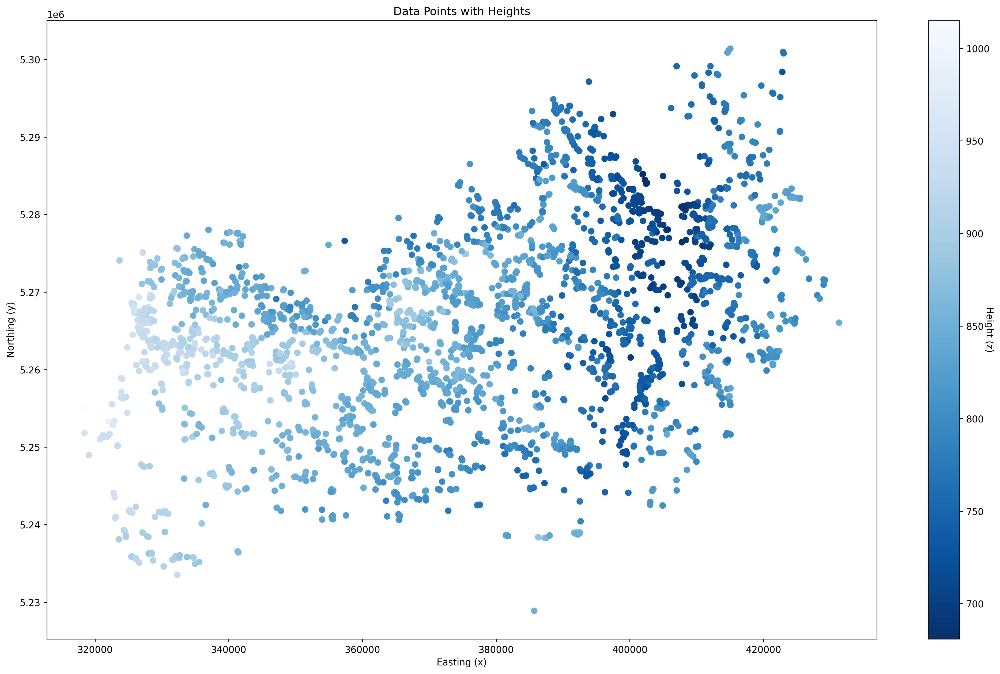

In [108]:
# Height Plot
plt.figure(figsize=(20, 12), dpi= 250, facecolor='w', edgecolor='k')

plt.scatter(x, y, c=z, cmap="Blues_r")
cbar = plt.colorbar()
cbar.ax.set_ylabel('Height (z)', rotation=270)
plt.title(f"Data Points with Heights")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

Text(0.5, 0, 'Easting (x)')

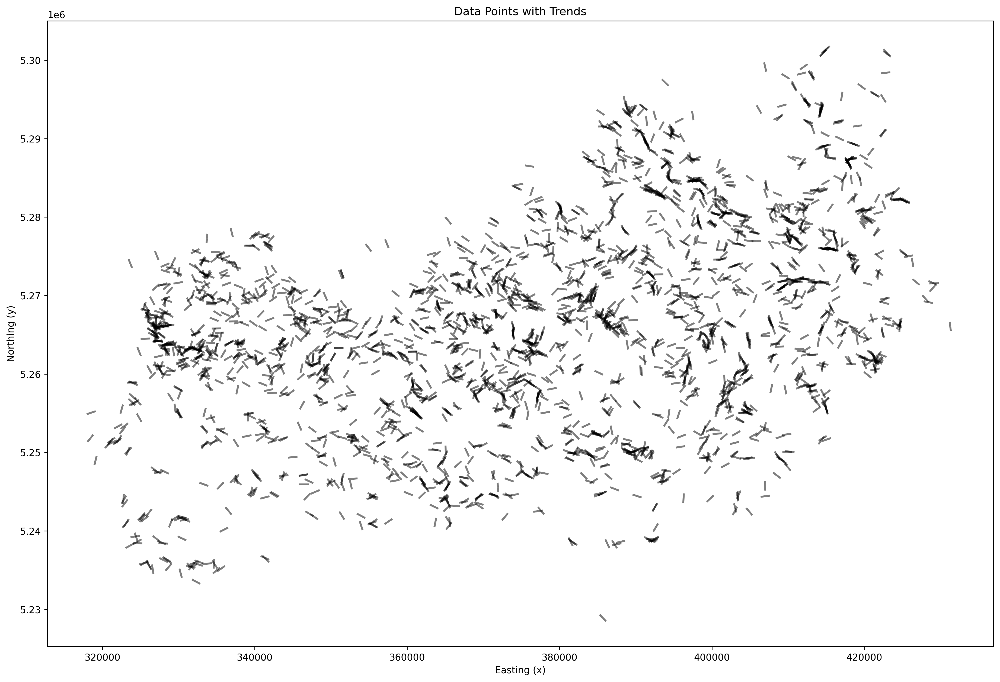

In [109]:
plt.figure(figsize=(18, 12), dpi= 250, facecolor='w', edgecolor='k')
plt.quiver(x,y,v_x,v_y, alpha = 0.5, color = 'black', scale = 200, width = 0.002, headlength = 0, headwidth = 1)
plt.quiver(x,y,-v_x,-v_y, alpha = 0.5, color = 'black', scale = 200, width = 0.002, headlength = 0, headwidth = 1)

plt.title(f"Data Points with Trends")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

Text(0.5, 0, 'Easting (x)')

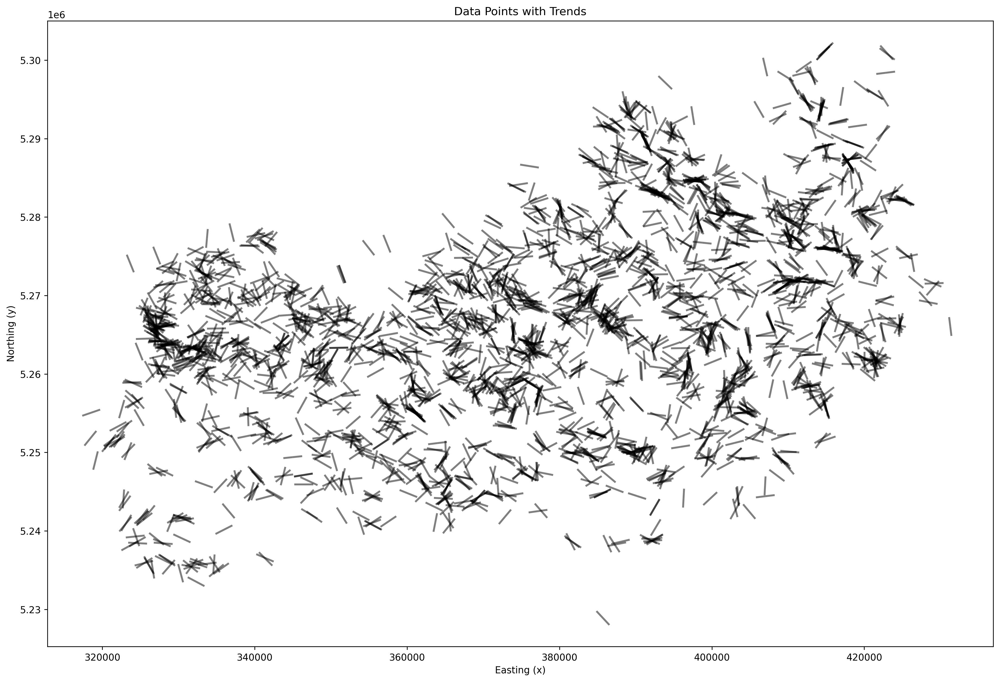

In [110]:
# Flow field plot with longer line segements
plt.figure(figsize=(18, 12), dpi= 250, facecolor='w', edgecolor='k')
plt.quiver(x,y,v_x,v_y, alpha = 0.5, color = 'black', scale = 100, width = 0.002, headlength = 0, headwidth = 1)
plt.quiver(x,y,-v_x,-v_y, alpha = 0.5, color = 'black', scale = 100, width = 0.002, headlength = 0, headwidth = 1)

plt.title(f"Data Points with Trends")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

In [112]:
Corr_elev2 = kp(x, y, z)
df2["Corr_elev2"] = Corr_elev2
df2.head()

,Easting,Northing,Elev,Trend,Delta,v_x,v_y,Corr_elev2
1,318433,5251799,952,39,51.0,0.629320,0.777146,74.272499
2,318541,5255062,1015,71,19.0,0.945519,0.325568,128.794738
3,319108,5248963,934,14,76.0,0.241922,0.970296,65.405169
4,320758,5251012,948,40,50.0,0.642788,0.766044,77.712193
5,321021,5251334,948,38,52.0,0.615661,0.788011,77.454639


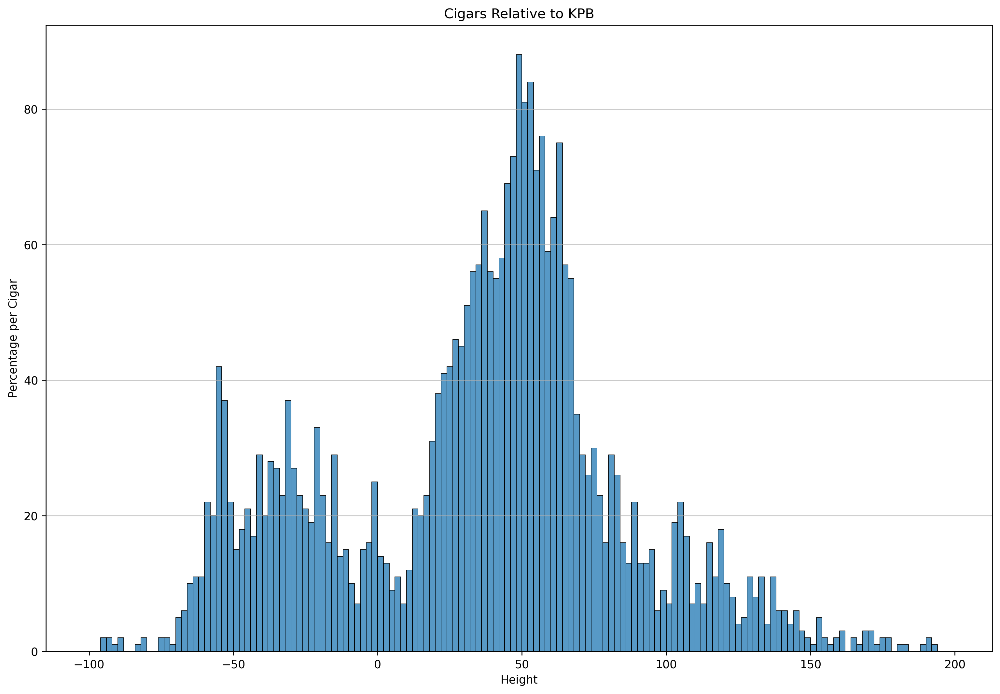

In [115]:
plt.figure(figsize=(15, 10), dpi= 250, facecolor='w', edgecolor='k')
sns.histplot(df2["Corr_elev2"], bins=np.arange(-100, 200, 2))

plt.title('Cigars Relative to KPB')
plt.xlabel('Height')
plt.ylabel('Percentage per Cigar')
plt.grid(axis='y', alpha=0.75)

Text(0.5, 0, 'Easting (x)')

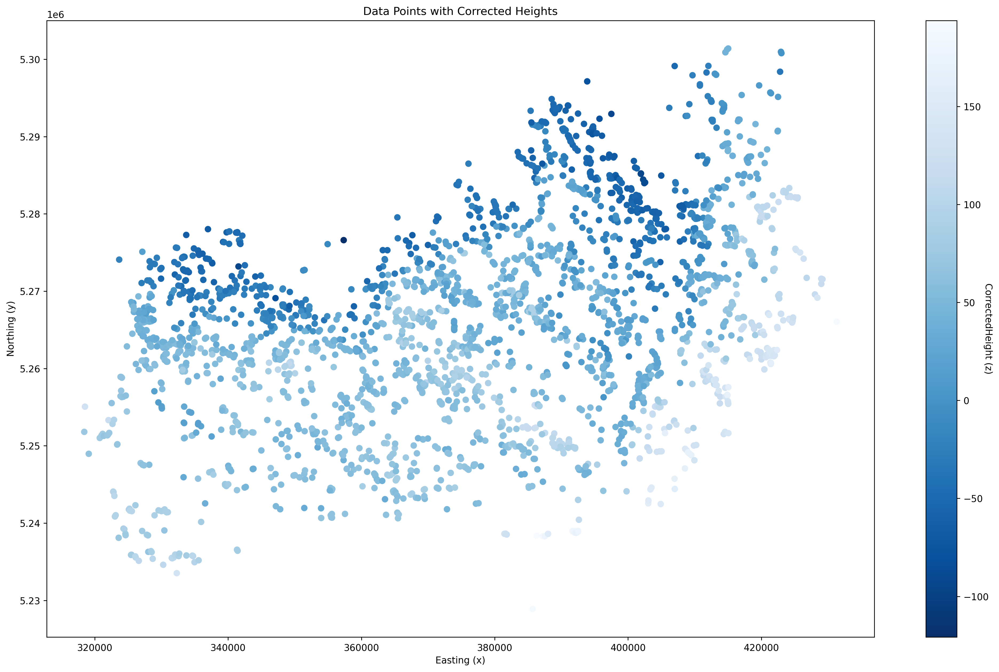

In [116]:
plt.figure(figsize=(20, 12), dpi= 250, facecolor='w', edgecolor='k')

plt.scatter(x, y, c=Corr_elev2, cmap="Blues_r")
cbar = plt.colorbar()
cbar.ax.set_ylabel('CorrectedHeight (z)', rotation=270)
plt.title(f"Data Points with Corrected Heights")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

In [119]:
df2.head()

,Easting,Northing,Elev,Trend,Delta,v_x,v_y,Corr_elev2
1,318433,5251799,952,39,51.0,0.629320,0.777146,74.272499
2,318541,5255062,1015,71,19.0,0.945519,0.325568,128.794738
3,319108,5248963,934,14,76.0,0.241922,0.970296,65.405169
4,320758,5251012,948,40,50.0,0.642788,0.766044,77.712193
5,321021,5251334,948,38,52.0,0.615661,0.788011,77.454639


Text(0.5, 1.0, 'Cigar Trends Histogram')

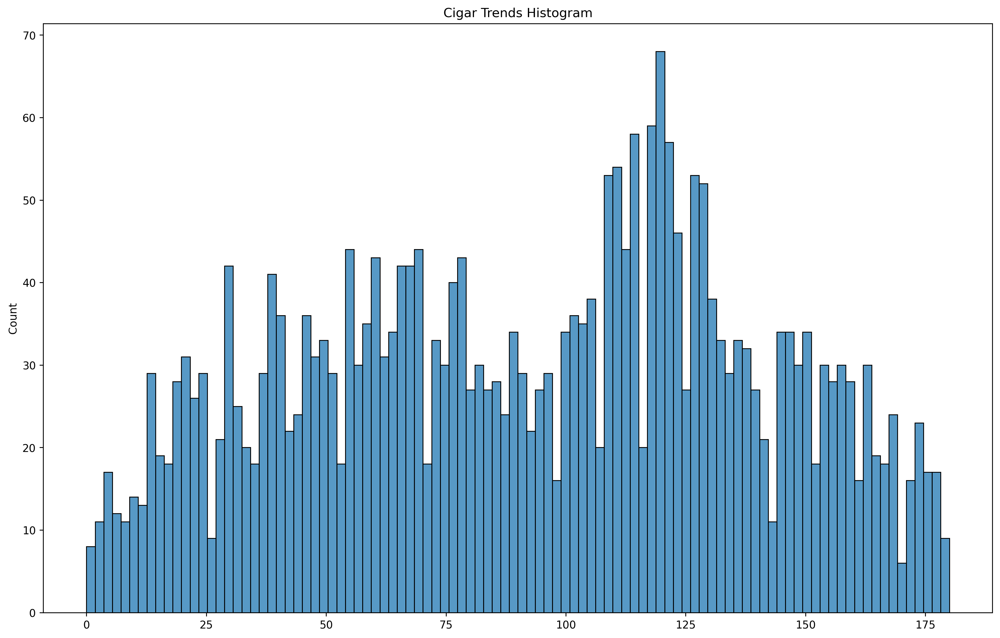

In [155]:
plt.figure(figsize=(16, 10), dpi= 250, facecolor='w', edgecolor='k')
delta = (90 - df2["Delta"])
delta = delta.values
for i in np.arange(delta.size):
    if delta[i] > 180:
        delta[i] = delta[i] - 180
sns.histplot(delta, bins = 100)

plt.title("Cigar Trends Histogram")

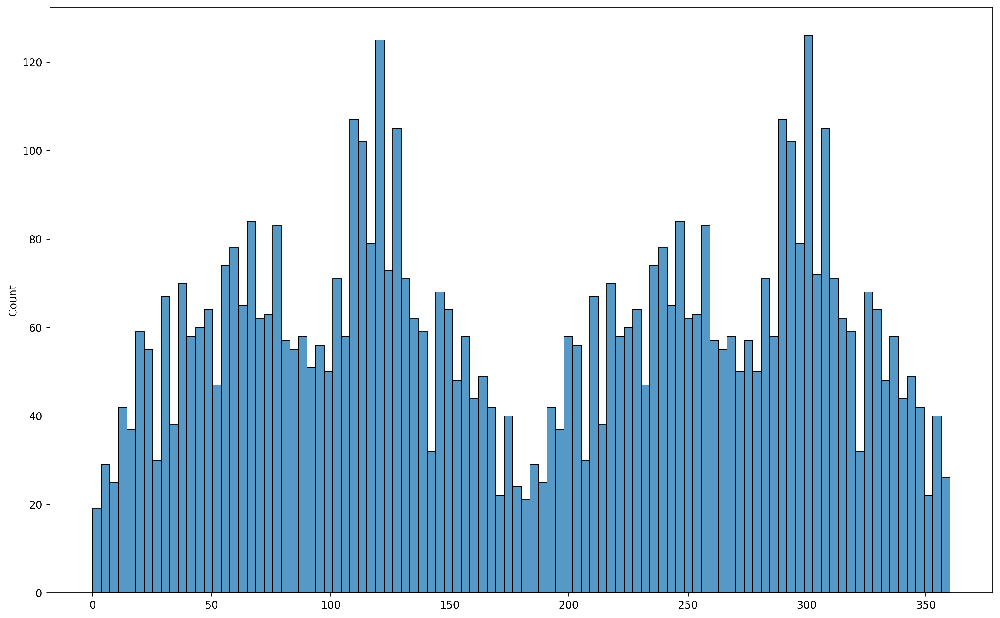

In [157]:
plt.figure(figsize=(16, 10), dpi= 250, facecolor='w', edgecolor='k')
total_delta = np.append(delta, delta + 180)
for i in range(total_delta.size):
    if total_delta[i] < 0:
        total_delta[i] = total_delta[i] + 360
total_delta_hist = sns.histplot(total_delta, bins = 100)

<Axes: ylabel='Count'>

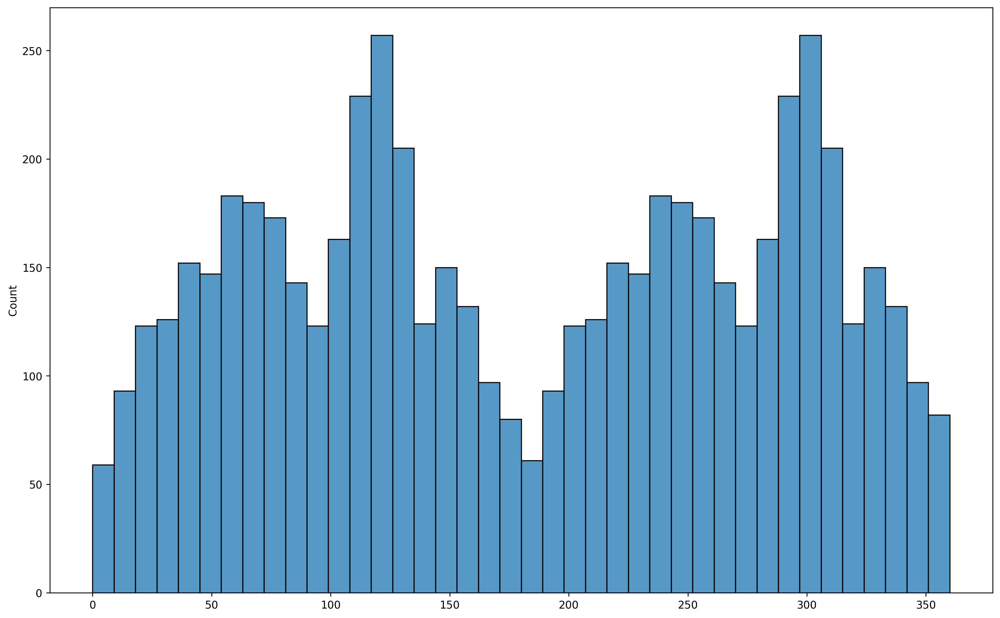

In [160]:
#Rose Diagram for Data2

plt.figure(figsize=(16, 10), dpi= 250, facecolor='w', edgecolor='k')
bin_edges = np.arange(0, 361, 9)
number_of_cigars, bin_edges = np.histogram(total_delta, bin_edges)
sns.histplot(total_delta, bins =bin_edges)

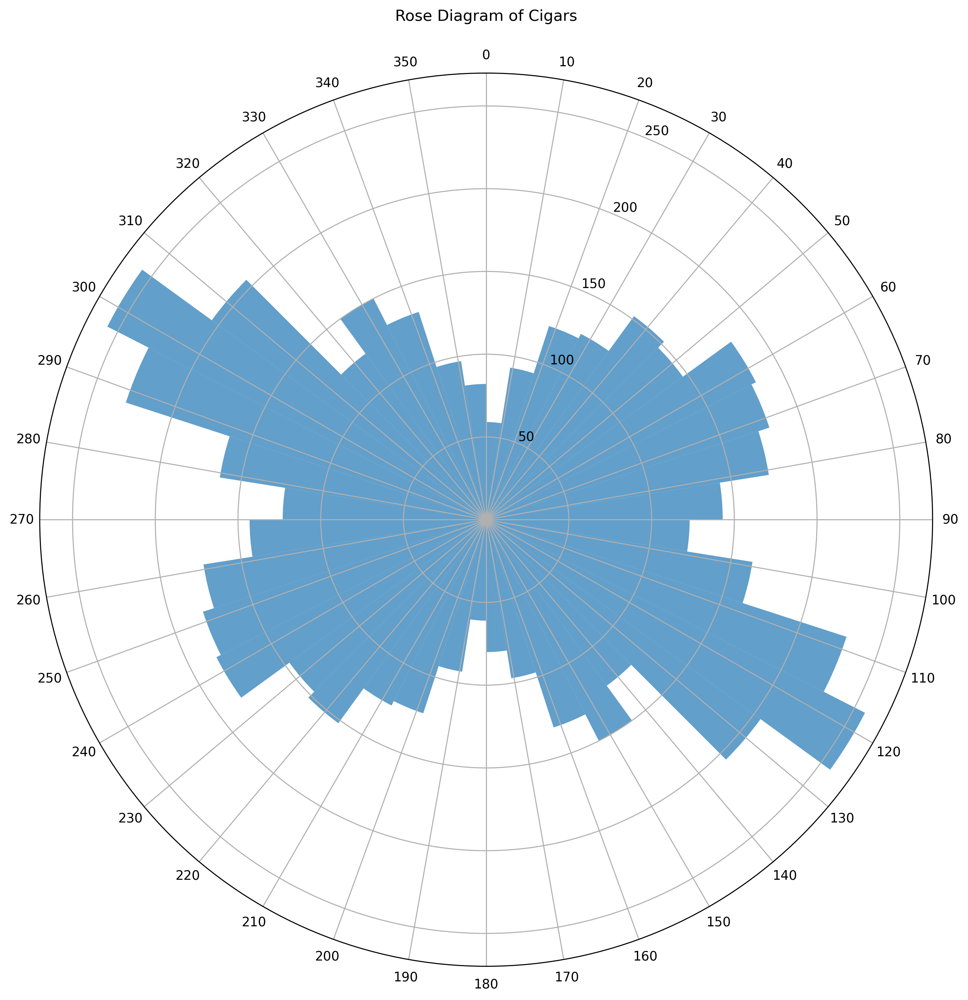

In [161]:
fig = plt.figure(figsize=(20, 12), dpi= 250, facecolor='white', edgecolor='k')

ax = fig.add_axes([0.1, 0.1, 0.8, 0.8], polar=True)



theta = np.arange(0, 2*np.pi, 2*np.pi/40) + (2*np.pi/80)
radii = number_of_cigars
width = np.pi/20
bars = ax.bar(theta, radii, width=width, bottom=0.0)

for r,bar in zip(radii, bars):
#    bar.set_facecolor( matplotlib.cm.jet(r/175.))
    bar.set_alpha(0.7)

ax.set_title("Rose Diagram of Cigars", y=1.05)
ax.set_thetagrids(np.arange(0, 360, 10), labels=np.arange(0, 360, 10))
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
plt.show()

Text(0.5, 0, 'Easting (x)')

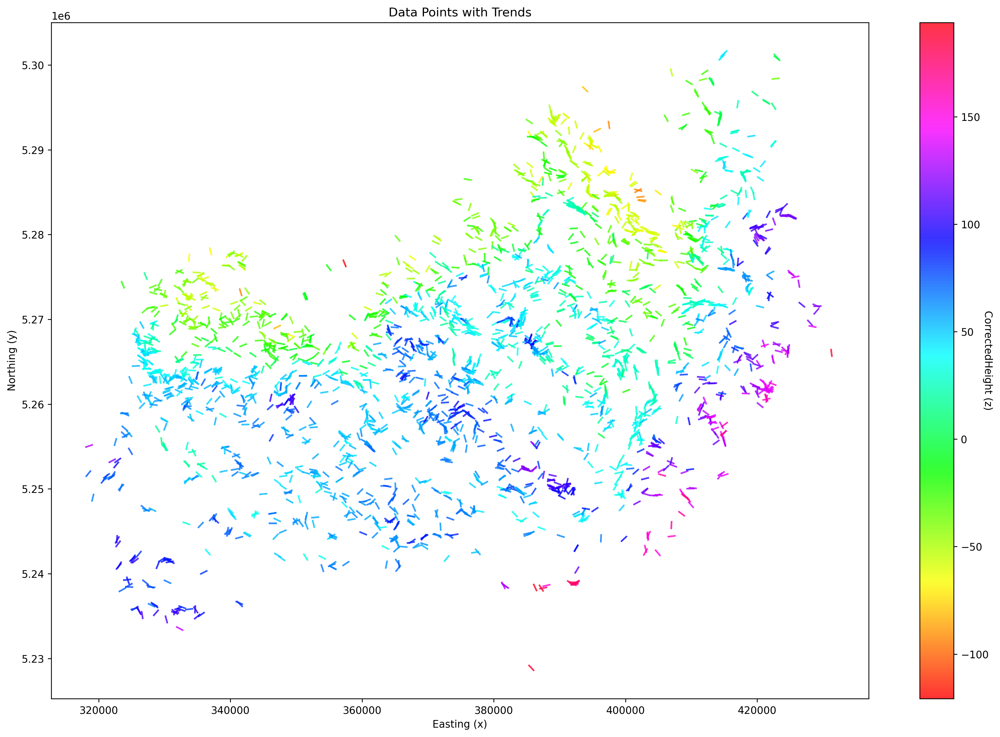

In [163]:
plt.figure(figsize=(18, 12), dpi= 250, facecolor='w', edgecolor='k')
plt.axes().set_facecolor("white")
plt.quiver(x,y,v_x,v_y, Corr_elev2, cmap="hsv", alpha = 0.8, scale = 200, width = 0.002, headlength = 0, headwidth = 1)
plt.quiver(x,y,-v_x,-v_y, Corr_elev2, cmap="hsv", alpha = 0.8, scale = 200, width = 0.002, headlength = 0, headwidth = 1)

cbar = plt.colorbar()
cbar.ax.set_ylabel('CorrectedHeight (z)', rotation=270)

plt.title("Data Points with Trends")
plt.ylabel(f"Northing (y)")
plt.xlabel(f"Easting (x)")

In [174]:
def mkdir_p(mypath):
    '''Creates a directory. equivalent to using mkdir -p on the command line'''

    from errno import EEXIST
    from os import makedirs,path

    try:
        makedirs(mypath)
    except OSError as exc: # Python >2.5
        if exc.errno == EEXIST and path.isdir(mypath):
            pass
        else: raise

def divide_bins(table, columnName, lowerBound, upperBound, interval):
    intervals = range(lowerBound, upperBound, interval) # upperBound must be larger than the targeted upperBound
    dividedTable = []
    for i in range(len(intervals) - 1):
        bin = table[(table[columnName] >= intervals[i]) & (table[columnName] < intervals[i+1])]
        dividedTable.append(bin)
    return dividedTable

def plot_vector(bins, interval, display = True, save = False):
    for i in range(len(bins)):
        bin = bins[i]
        
        fig = plt.figure(figsize=(18, 12), dpi= 300, facecolor='w', edgecolor='k')
        plt.quiver(bin["Easting"],bin["Northing"],bin["v_x"],bin["v_y"], alpha = 0.5, color = 'black', scale = 200, width = 0.002, headlength = 0, headwidth = 1)
        plt.quiver(bin["Easting"],bin["Northing"],-bin["v_x"],-bin["v_y"], alpha = 0.5, color = 'black', scale = 200, width = 0.002, headlength = 0, headwidth = 1)

        plt.title(f"Flow Field Diagram bin{i+1}, {interval * i} m - {interval * (i + 1)} m")
        plt.ylabel(f"Northing (y)")
        plt.xlabel(f"Easting (x)")
        #plt.axis("scaled")
        plt.xlim(310000,460000)
        plt.xticks(np.arange(310000, 461000, 10000))
        plt.ylim(5.22e6,5.31e6)
        plt.yticks(np.arange(5220000, 5321000, 10000))
        plt.grid(True, axis = 'both')


        if save:
            output_dir = "./flow_field"
            mkdir_p(output_dir)
            fig.savefig(f"{output_dir}/flow_field_bin{i+1}.png")
        
        if display:
            plt.ion()
        else:
            plt.close()
            plt.ioff()

def plot_rose(bins, angle_bins, interval, display = True, save = False): 
    for i in range(len(bins)):
        plt.ion()
        bin = bins[i]
        # data processing
        delta = 90 - bin["Delta"]
        total_delta = np.append(delta, delta + 180)
        for j in range(total_delta.size):
            if total_delta[j] < 0:
                total_delta[j] = total_delta[i] + 360
        bin_edges = np.arange(0, 361, 360/angle_bins)
        number_of_cigars, bin_edges = np.histogram(total_delta, bin_edges)

        #start ploting
        fig = plt.figure(figsize=(12, 12), dpi= 300, facecolor='white', edgecolor='k')
        ax = fig.add_axes([0.1, 0.1, 0.8, 0.8], polar=True)

        theta = np.arange(0, 2*np.pi, 2*np.pi/angle_bins) + (2*np.pi/(2*angle_bins))
        radii = number_of_cigars
        width = 2 * np.pi/angle_bins
        bars = ax.bar(theta, radii, width=width, bottom=0.0)

        for r,bar in zip(radii, bars):
        #    bar.set_facecolor( matplotlib.cm.jet(r/175.))
            bar.set_alpha(0.7)

        ax.set_title(f"Rose Diagram of Cigars bin{i+1}, {interval * i} m - {interval * (i + 1)} m", y=1.05)
        ax.set_thetagrids(np.arange(0, 360, 10), labels=np.arange(0, 360, 10))
        ax.set_theta_zero_location("N")
        ax.set_theta_direction(-1)
        
        
        if save:
            output_dir = "./rose_diagram"
            mkdir_p(output_dir)
            fig.savefig(f"{output_dir}/rose_diagram_bin{i+1}.png")
        
        if display:
            plt.ion()
        else:
            plt.close()
            plt.ioff()
        

In [185]:
#Rose Diagram with bins of 25m

In [172]:
bins_25 = divide_bins(df2, "Corr_elev2", -100, 201, 25)
plot_vector(bins_25, 25, False, False)

In [175]:
plot_rose(bins_25, 40, False, False)

In [ ]:
#Rose Diagram with bins of 5m

In [177]:
bins_5 = divide_bins(df2, "Corr_elev2", -100, 201, 5)
plot_vector(bins_5, 5, False, True)

In [178]:
plot_rose(bins_5, 40, 5, False, False)

In [183]:
def plot_rose_new(bins, angle_bins, interval, display = True, save = False): 
    for i in range(len(bins)):
        plt.ion()
        bin = bins[i]
        # data processing
        delta = 90 - bin["Delta"]
        total_delta = np.append(delta, delta + 180)
        for j in range(total_delta.size):
            if total_delta[j] < 0:
                total_delta[j] = total_delta[i] + 360
        bin_edges = np.arange(0, 361, 360/angle_bins)
        number_of_cigars, bin_edges = np.histogram(total_delta, bin_edges)

        #start ploting
        fig = plt.figure(figsize=(12, 12), dpi= 250, facecolor='white', edgecolor='k')
        ax = fig.add_axes([0.1, 0.1, 0.8, 0.8], polar=True)

        theta = np.arange(0, 2*np.pi, 2*np.pi/angle_bins) + (2*np.pi/(2*angle_bins))
        radii = number_of_cigars
        width = 2 * np.pi/angle_bins
        bars = ax.bar(theta, radii, width=width, bottom=0.0)

        for r,bar in zip(radii, bars):
        #    bar.set_facecolor( matplotlib.cm.jet(r/175.))
            bar.set_alpha(0.7)

        ax.set_title(f"Rose Diagram of Cigars bin{i+1}, {interval * i} m - {interval * (i + 1)} m", y=1.05)
        ax.set_thetagrids(np.arange(0, 360, 10), labels=np.arange(0, 360, 10))
        ax.set_theta_zero_location("N")
        ax.set_theta_direction(-1)
        ax.set_ylim(0, 25)
        
        if save:
            output_dir = "./rose_diagram"
            mkdir_p(output_dir)
            fig.savefig(f"{output_dir}/rose_diagram_bin{i+1}.png")
        
        if display:
            plt.ion()
        else:
            plt.close()
            plt.ioff()

In [184]:
plot_rose_new(bins_5, 40, 5, False, True)